In [ ]:
import cv2
import numpy as np

img = cv2.imread('NuZNp.jpg')

# creating mask using thresholding over `red` channel (use better use histogram to get threshoding value)
# I have used 200 as thershoding value it can be different for different images
ret, mask = cv2.threshold(img[:, :,2], 200, 255, cv2.THRESH_BINARY)

mask3 = np.zeros_like(img)
mask3[:, :, 0] = mask
mask3[:, :, 1] = mask
mask3[:, :, 2] = mask

# extracting `orange` region using `biteise_and`
orange = cv2.bitwise_and(img, mask3)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img  = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

# extracting non-orange region
gray = cv2.bitwise_and(img, 255 - mask3)

# orange masked output
out = gray + orange

cv2.imwrite('orange.png', orange)
cv2.imwrite('gray.png', gray)
cv2.imwrite("output.png", out)

TypeError: ignored

In [ ]:
print (out)

NameError: ignored

In [ ]:
import numpy as np
from skimage.io import imread
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pylab as plt

In [ ]:
im = imread('000003.png')
im1 = rgb2lab(im)

In [ ]:
im1[...,1] = im1[...,2] = 0


In [ ]:
#Obtain the grayscale image by converting the image back into the RGB color space
im1 = lab2rgb(im1)


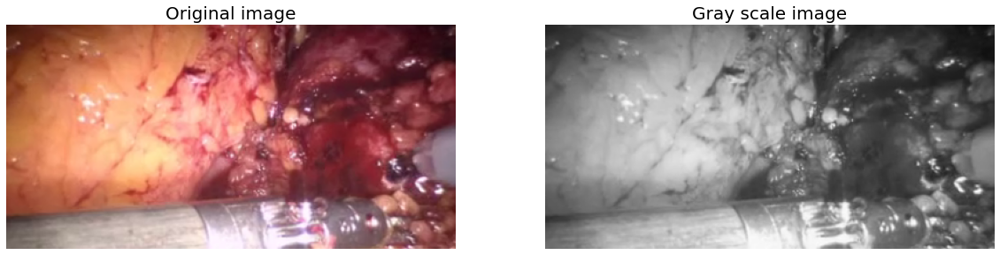

In [ ]:
#Plot the input and output images, as shown in the following code:
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Original image', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Gray scale image', size=20)
plt.show()

In [ ]:
#Changing brightness
im1 = rgb2lab(im)
im1[...,0] = im1[...,0] + 50 

In [ ]:
im1 = lab2rgb(im1)

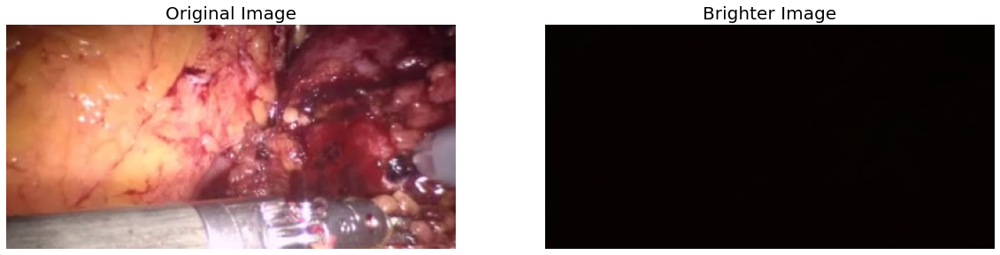

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Brighter Image', size=20)
plt.show()

In [ ]:
im1 = rgb2lab(im)
im1[...,0] = im1[...,0] - 50 
im1 = lab2rgb(im1)

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 124438 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


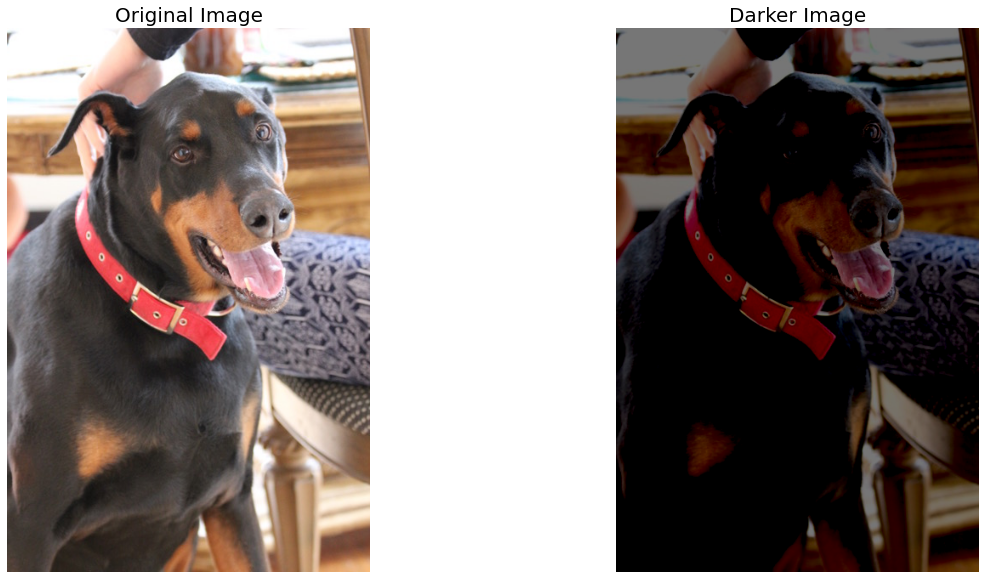

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Darker Image', size=20)
plt.show()

In [ ]:
im1 = rgb2lab(im)
im1[...,0] = np.max(im1[...,0]) - im1[...,0]
im1 = lab2rgb(im1)

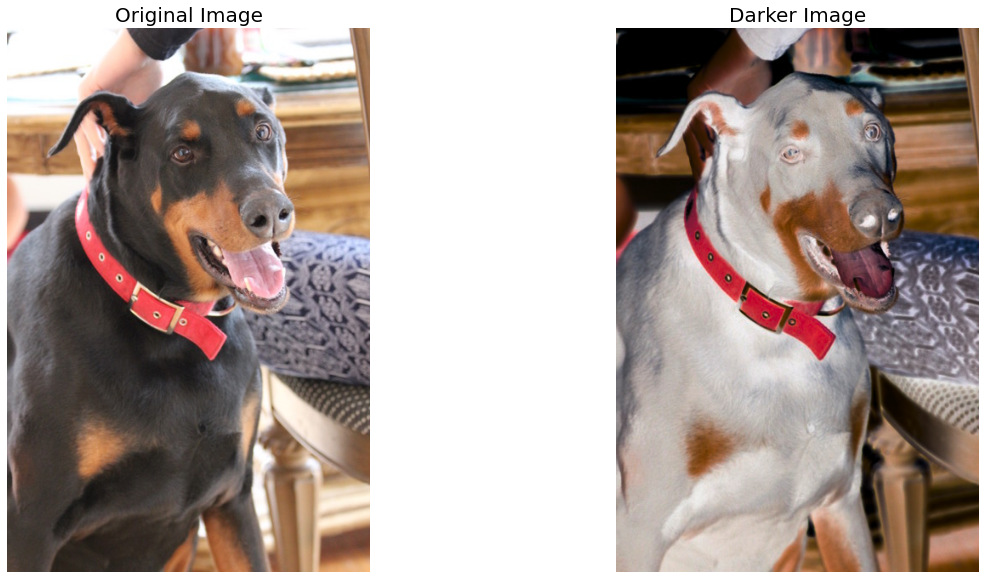

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Darker Image', size=20)
plt.show()

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

In [ ]:
bck = cv2.imread("fish_bg.jpg")
img = cv2.imread("fish.jpg")
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

In [ ]:
mask = cv2.inRange(hsv, (5, 75, 25), (25, 255, 255))


In [ ]:
imask = mask>0
orange = np.zeros_like(img, np.uint8)
orange[imask] = img[imask]

In [ ]:
yellow = img.copy()
hsv[...,0] = hsv[...,0] - 20
yellow[imask] = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)[imask]
yellow = np.clip(yellow, 0, 255)

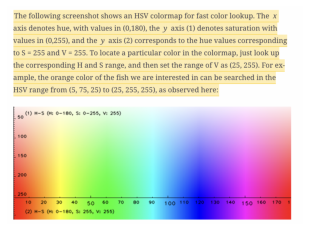

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('Screen Shot 2021-10-21 at 6.59.51 PM.png')
imgplot = plt.imshow(img), plt.axis('off')
plt.show()

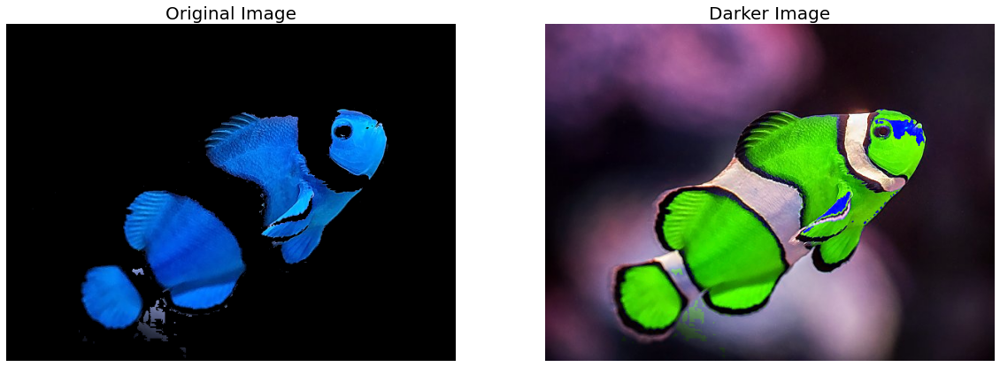

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(orange), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(122), plt.imshow(yellow), plt.axis('off'), plt.title('Darker Image', size=20)
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
import numpy as np

In [ ]:
img = cv2.imread("red.jpg")
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

In [ ]:
lower_range = np.array([169,100,100])
upper_range = np.array([189,255,255])

In [ ]:
mask = cv2.inRange(hsv, lower_range, upper_range)

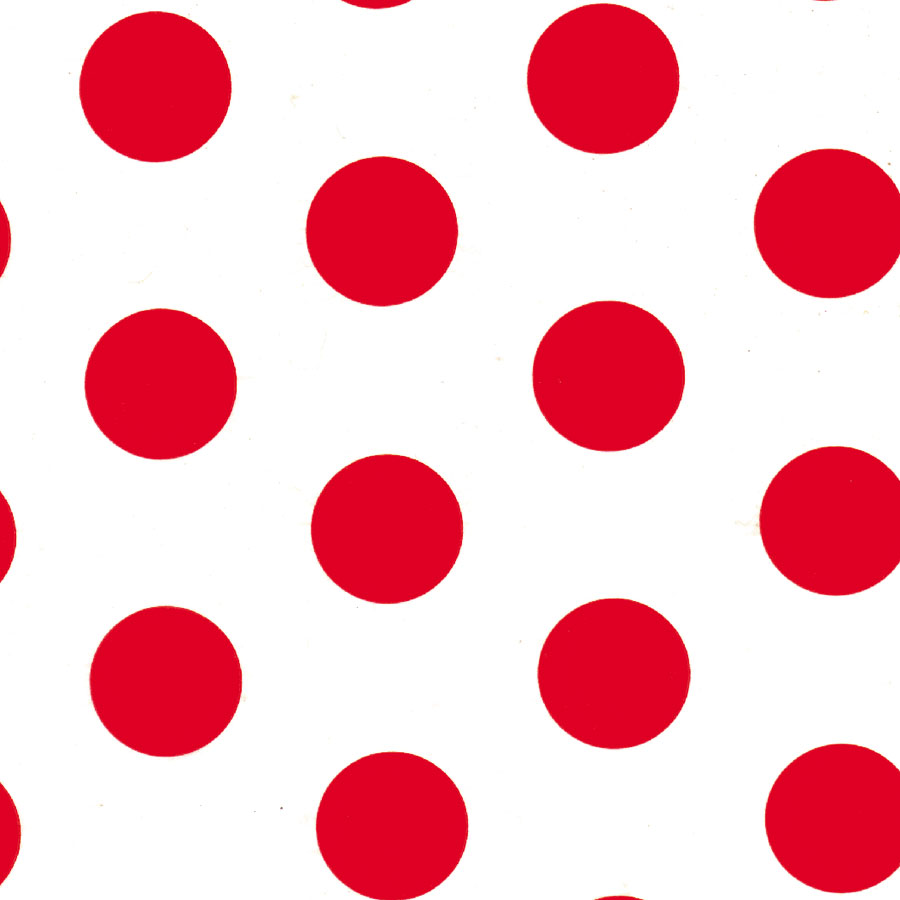

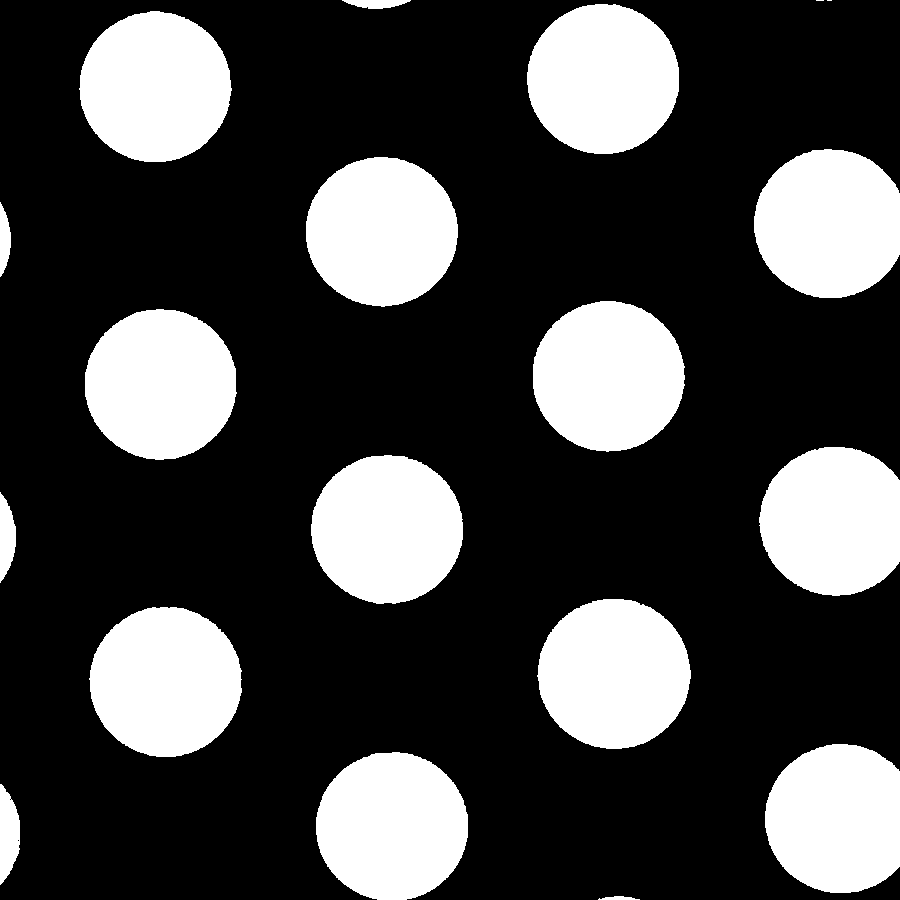

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)
cv2_imshow(mask)

# Fish Tutorial
https://realpython.com/python-opencv-color-spaces/

In [ ]:
import cv2

In [ ]:
flags = [i for i in dir(cv2) if i.startswith('COLOR_')]

In [ ]:
len(flags)

274

In [ ]:
flags[40]

'COLOR_BGR2HLS'

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
#OpenCV by default reads images in BGR format

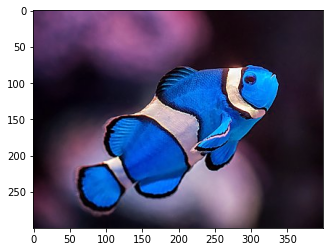

In [ ]:
nemo = cv2.imread('nemo0.jpg')
plt.imshow(nemo)
plt.show()

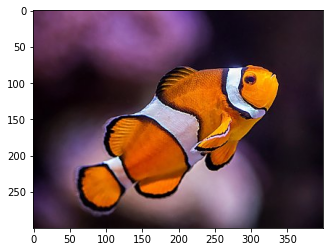

In [ ]:
#You can use the cvtColor(image, flag) and the flag we looked at above to fix this
nemo = cv2.cvtColor(nemo, cv2.COLOR_BGR2RGB)
plt.imshow(nemo)
plt.show()

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors

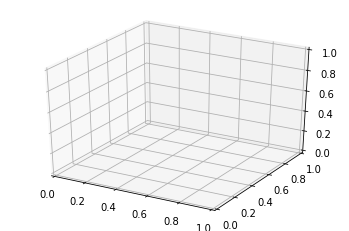

In [ ]:
r, g, b = cv2.split(nemo)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")
#Setting up the plot for color distribution

In [ ]:
pixel_colors = nemo.reshape((np.shape(nemo)[0]*np.shape(nemo)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

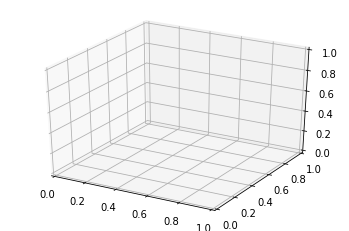

In [ ]:
axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
r, g, b = cv2.split(nemo)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")
#Setting up the plot for color distribution
plt.show()

In [ ]:
hsv_nemo = cv2.cvtColor(nemo, cv2.COLOR_RGB2HSV)

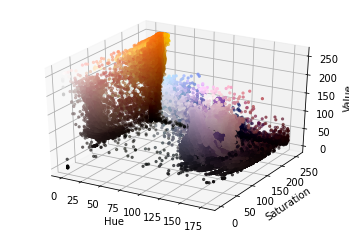

In [ ]:
#HSV color space different dont know why not getting results for RGB
h, s, v = cv2.split(hsv_nemo)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Hue")
axis.set_ylabel("Saturation")
axis.set_zlabel("Value")
plt.show()

In [ ]:
#Picking out the colors
light_orange = (1, 190, 200)
dark_orange = (18, 255, 255)

In [ ]:
#display colors
from matplotlib.colors import hsv_to_rgb
lo_square = np.full((10, 10, 3), light_orange, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), dark_orange, dtype=np.uint8) / 255.0

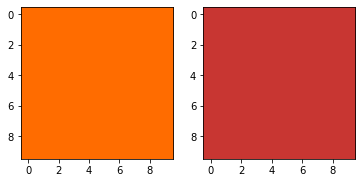

In [ ]:
 #Plot the colors in squares
 plt.subplot(1, 2, 1)
 plt.imshow(hsv_to_rgb(do_square))
 plt.subplot(1, 2, 2)
 plt.imshow(hsv_to_rgb(lo_square))
 plt.show()
 #Once you get a decent color range, you can use cv2.inRange() to try to threshold Nemo. inRange() 
 #takes three parameters: the image, the lower range,mask = cv2.inRange(hsv_nemo, light_orange, dark_orange) and the higher range.

In [ ]:
mask = cv2.inRange(hsv_nemo, light_orange, dark_orange)

In [ ]:
result = cv2.bitwise_and(nemo, nemo, mask=mask) 

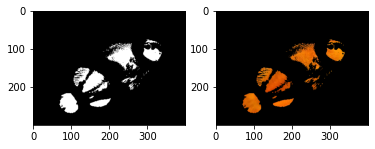

In [ ]:
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.show()

In [ ]:
#problem is nemo has white stripes
light_white = (0, 0, 200)
dark_white = (145, 60, 255)

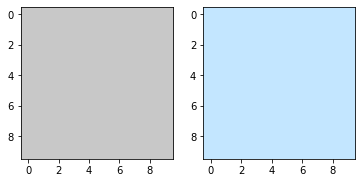

In [ ]:
lw_square = np.full((10, 10, 3), light_white, dtype=np.uint8) / 255.0
dw_square = np.full((10, 10, 3), dark_white, dtype=np.uint8) / 255.0

plt.subplot(1, 2, 1)
plt.imshow(hsv_to_rgb(lw_square))
plt.subplot(1, 2, 2)
plt.imshow(hsv_to_rgb(dw_square))
plt.show()

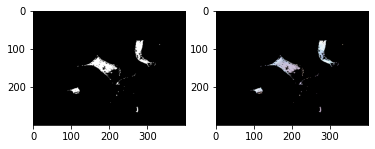

In [ ]:
mask_white = cv2.inRange(hsv_nemo, light_white, dark_white)
result_white = cv2.bitwise_and(nemo, nemo, mask=mask_white)

plt.subplot(1, 2, 1)
plt.imshow(mask_white, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(result_white)
plt.show()

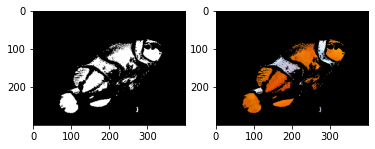

In [ ]:
#combine the masks
final_mask = mask + mask_white

final_result = cv2.bitwise_and(nemo, nemo, mask=final_mask)
plt.subplot(1, 2, 1)
plt.imshow(final_mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(final_result)
plt.show()

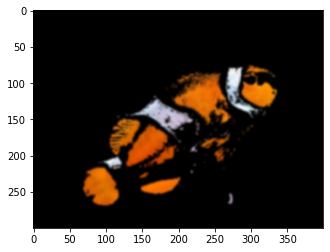

In [ ]:
#A Gaussian blur is an image filter that uses a kind of function called a Gaussian 
#to transform each pixel in the image. It has the result of smoothing out 
#image noise and reducing detail. Here’s what applying the blur looks like for our image:
blur = cv2.GaussianBlur(final_result, (7, 7), 0)
plt.imshow(blur)
plt.show()

# Same Tutorial
But with anatomy images


In [ ]:
import cv2


In [ ]:
flags = [i for i in dir(cv2) if i.startswith('COLOR_')]

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
#OpenCV by default reads images in BGR format

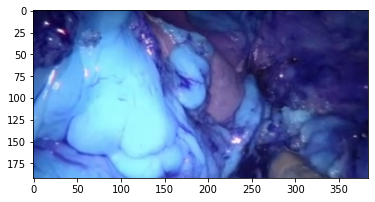

In [ ]:
robo = cv2.imread('robo.png')
plt.imshow(robo)
plt.show()

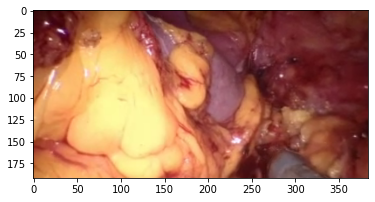

In [ ]:
#You can use the cvtColor(image, flag) and the flag we looked at above to fix this
robo = cv2.cvtColor(robo, cv2.COLOR_BGR2RGB)
plt.imshow(robo)
plt.show()

In [ ]:
hsv_robo = cv2.cvtColor(robo, cv2.COLOR_RGB2HSV)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors
import pandas as pd

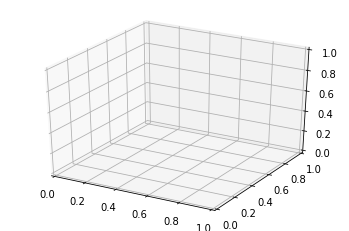

In [ ]:
r, g, b = cv2.split(robo)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")
#Setting up the plot for color distribution

In [ ]:
pixel_colors = robo.reshape((np.shape(robo)[0]*np.shape(robo)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

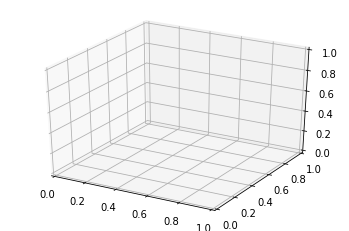

In [ ]:
axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
r, g, b = cv2.split(robo)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")
#Setting up the plot for color distribution
plt.show()

NameError: ignored

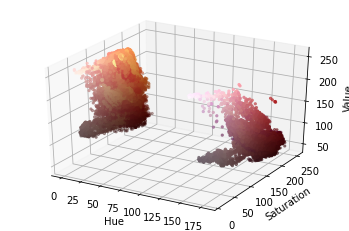

In [ ]:
h, s, v = cv2.split(hsv_robo)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Hue")
axis.set_ylabel("Saturation")
axis.set_zlabel("Value")
plt.imshow(A, interpolation='nearest', aspect='auto')
plt.show()

In [ ]:
import colorsys

In [ ]:
import cv2
image = cv2.imread("robo.png")
color = image[0,192]
print(color)

[ 23  53 109]


In [ ]:
#Picking out the colors
lower_red = np.array([0,0,0])
upper_red = np.array([255,255,255])

In [ ]:
#display colors
from matplotlib.colors import hsv_to_rgb
lo_square = np.full((10, 10, 3), lower_red, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), upper_red, dtype=np.uint8) / 255.0

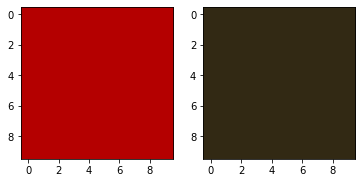

In [ ]:
 #Plot the colors in squares
 plt.subplot(1, 2, 1)
 plt.imshow(hsv_to_rgb(do_square))
 plt.subplot(1, 2, 2)
 plt.imshow(hsv_to_rgb(lo_square))
 plt.show()
 #Once you get a decent color range, you can use cv2.inRange() to try to threshold Nemo. inRange() 
 #takes three parameters: the image, the lower range,mask = cv2.inRange(hsv_nemo, light_orange, dark_orange) and the higher range.

In [ ]:
mask = cv2.inRange(hsv_robo, light_orange, dark_orange)

In [ ]:
result = cv2.bitwise_and(robo, robo, mask=mask) 

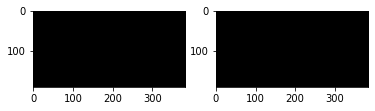

In [ ]:
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.show()

# Matplotlib image tutorial¶


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

In [ ]:
img = mpimg.imread('robo.png')
img.shape

(192, 384, 3)

In [ ]:
s = 3
print(img[:s,:s:,0])
print(img[:s,:s:,1])
print(img[:s,:s:,2])

[[0.29803923 0.2901961  0.2901961 ]
 [0.29803923 0.29411766 0.29411766]
 [0.3019608  0.29803923 0.29411766]]
[[0.09019608 0.08235294 0.08235294]
 [0.09019608 0.08235294 0.08235294]
 [0.09019608 0.08235294 0.08235294]]
[[0.04313726 0.04313726 0.04705882]
 [0.04313726 0.04313726 0.04705882]
 [0.03921569 0.03921569 0.04313726]]


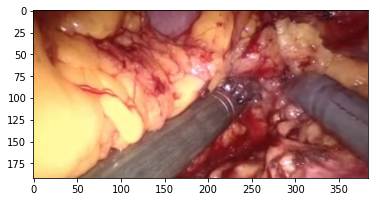

In [ ]:
plt.imshow(img);


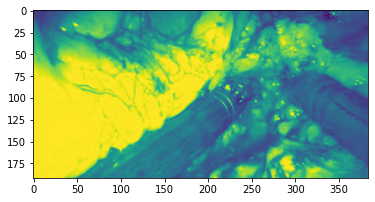

In [ ]:
lum_img = img[:,:,0] #inverse
fig, ax = plt.subplots()
imgplot = ax.imshow(lum_img)

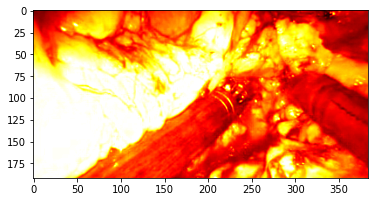

In [ ]:
imgplot.set_cmap('hot') #hot
imgplot.figure

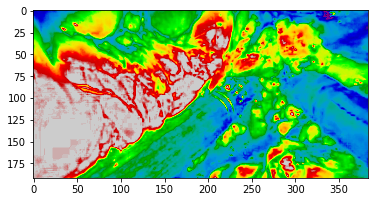

In [ ]:
imgplot.set_cmap('nipy_spectral') #thermal specturm
imgplot.figure

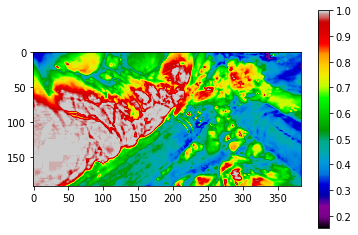

In [ ]:
imgplot.set_cmap('nipy_spectral')
fig.colorbar(imgplot)
fig

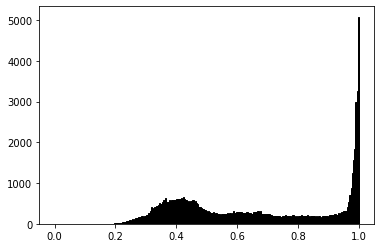

In [ ]:
plt.hist(lum_img.flatten(), bins=256, range=(0.0, 1.0), fc='k', ec='k');

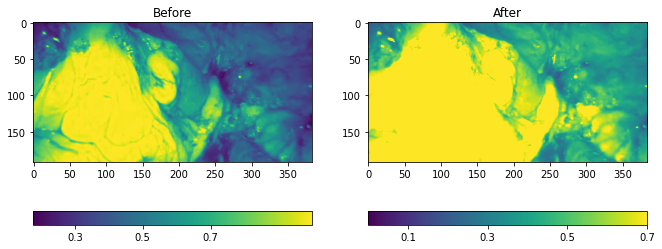

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 6))

imgplot1 = ax1.imshow(lum_img)
ax1.set_title('Before')
fig.colorbar(imgplot1, ax=ax1, ticks=[0.1, 0.3, 0.5, 0.7], orientation ='horizontal')

imgplot2 = ax2.imshow(lum_img)
imgplot2.set_clim(0.0, 0.7)   # Set the color limits manually
ax2.set_title('After')
fig.colorbar(imgplot2, ax=ax2, ticks=[0.1, 0.3, 0.5, 0.7], orientation='horizontal');

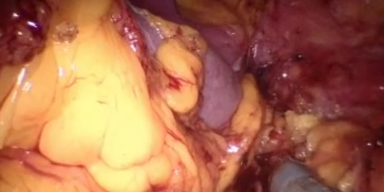

In [ ]:
from PIL import Image
img = Image.open('robo.png')    # Open image as PIL image object
img

In [ ]:
rsize = img.resize((np.array(img.size)/10).astype(int)) # Use PIL to resize
rsize

In [ ]:
rsizeArr = np.asarray(rsize)  # Get array back
rsizeArr.shape 

(19, 38, 3)

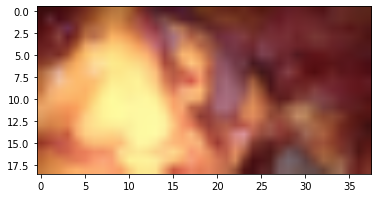

In [ ]:
#Zoom it out
imgplot = plt.imshow(rsizeArr, interpolation='bilinear')

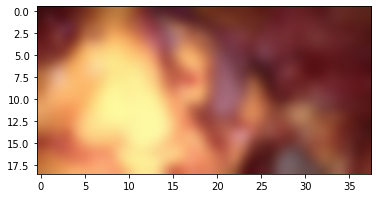

In [ ]:
#get rid of the pixels
imgplot.set_interpolation('bicubic')
imgplot.figure

# MutliChannel Images
Images with different colors

In [ ]:
sg = mpimg.imread('robo.png')
sg.shape

(192, 384, 3)

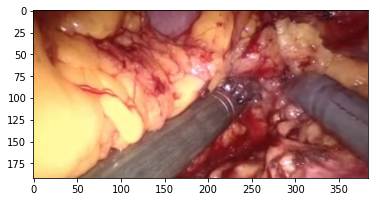

In [ ]:
plt.rcParams['figure.figsize'] = (6, 12)
plt.imshow(sg);

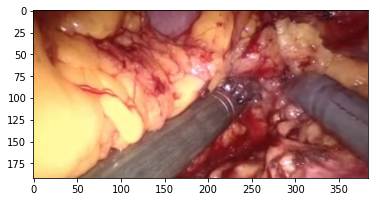

In [ ]:
plt.imshow(sg[:,:,:3]);

In [ ]:
np.unique(sg[:,:,2])

array([0.02352941, 0.02745098, 0.03137255, 0.03529412, 0.03921569,
       0.04313726, 0.04705882, 0.05098039, 0.05490196, 0.05882353,
       0.0627451 , 0.06666667, 0.07058824, 0.07450981, 0.07843138,
       0.08235294, 0.08627451, 0.09019608, 0.09411765, 0.09803922,
       0.10196079, 0.10588235, 0.10980392, 0.11372549, 0.11764706,
       0.12156863, 0.1254902 , 0.12941177, 0.13333334, 0.13725491,
       0.14117648, 0.14509805, 0.14901961, 0.15294118, 0.15686275,
       0.16078432, 0.16470589, 0.16862746, 0.17254902, 0.1764706 ,
       0.18039216, 0.18431373, 0.1882353 , 0.19215687, 0.19607843,
       0.2       , 0.20392157, 0.20784314, 0.21176471, 0.21568628,
       0.21960784, 0.22352941, 0.22745098, 0.23137255, 0.23529412,
       0.23921569, 0.24313726, 0.24705882, 0.2509804 , 0.25490198,
       0.25882354, 0.2627451 , 0.26666668, 0.27058825, 0.27450982,
       0.2784314 , 0.28235295, 0.28627452, 0.2901961 , 0.29411766,
       0.29803923, 0.3019608 , 0.30588236, 0.30980393, 0.31372

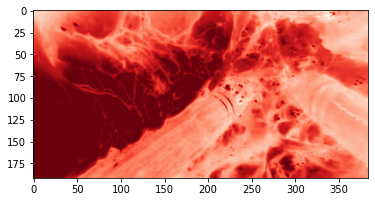

In [ ]:
plt.imshow(sg[:,:,0], cmap='Reds'); #problem is the way how its being shown is only 
#the lighting of the image thats take into account for, not the actual color and or anatomy 
#of the image

# Color Isolation
https://towardsdatascience.com/image-processing-with-python-color-isolation-for-beginners-3b472293335b

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imshow, imread
from skimage.color import rgb2hsv, hsv2rgb
import cv2

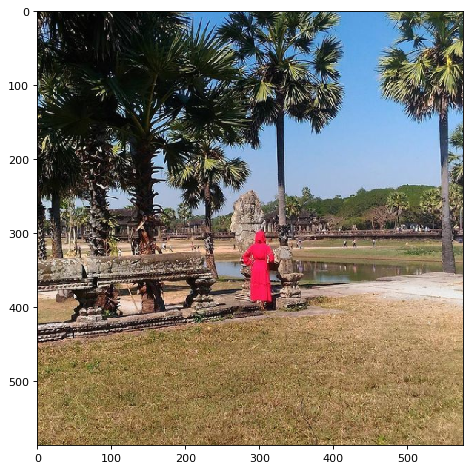

In [ ]:
red_girl = imread('red_girl.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(red_girl);

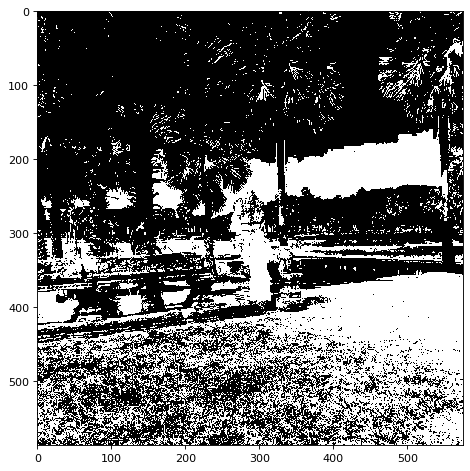

In [ ]:
#grayscale an image
red_filtered_girl = (red_girl[:,:,0] > 150)
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(red_filtered_girl, cmap = 'gray');

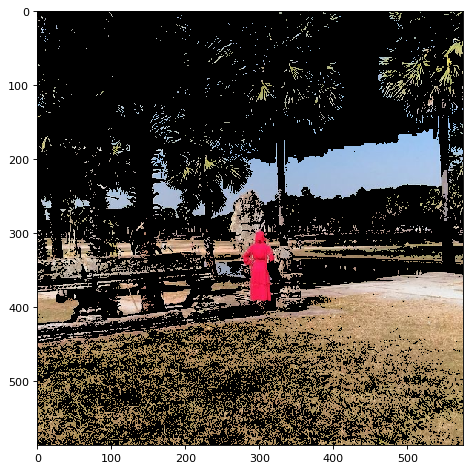

In [ ]:
#applying a filter mas to show the different image segmentation at first
red_girl_new = red_girl.copy()
red_girl_new[:, :, 0] = red_girl_new[:, :, 0]*red_filtered_girl
red_girl_new[:, :, 1] = red_girl_new[:, :, 1]*red_filtered_girl
red_girl_new[:, :, 2] = red_girl_new[:, :, 2]*red_filtered_girl
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(red_girl_new);

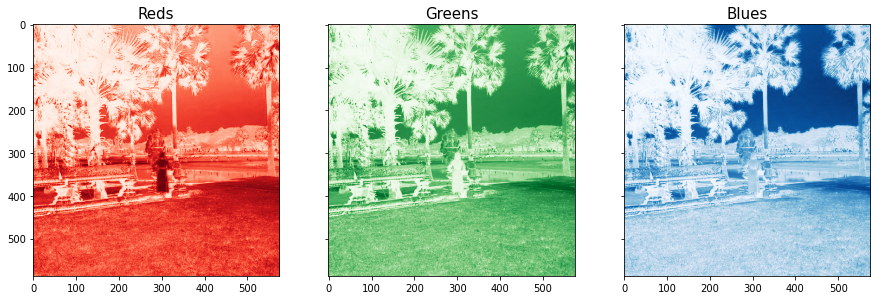

In [ ]:
#splitting the RGB
def rgb_splitter(image):
    rgb_list = ['Reds','Greens','Blues']
    fig, ax = plt.subplots(1, 3, figsize=(15,5), sharey = True)
    for i in range(3):
        ax[i].imshow(image[:,:,i], cmap = rgb_list[i])
        ax[i].set_title(rgb_list[i], fontsize = 15)
rgb_splitter(red_girl)

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


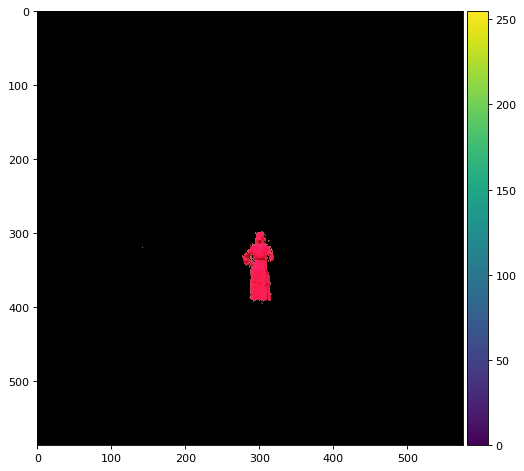

In [ ]:
#filtering out the green and blue channels
red_filtered = (red_girl[:,:,0] > 150) & (red_girl[:,:,1] < 100) & (red_girl[:,:,2] < 110)
plt.figure(num=None, figsize=(8, 6), dpi=80)
red_girl_new = red_girl.copy()
red_girl_new[:, :, 0] = red_girl_new[:, :, 0] * red_filtered
red_girl_new[:, :, 1] = red_girl_new[:, :, 1] * red_filtered
red_girl_new[:, :, 2] = red_girl_new[:, :, 2] * red_filtered
imshow(red_girl_new);

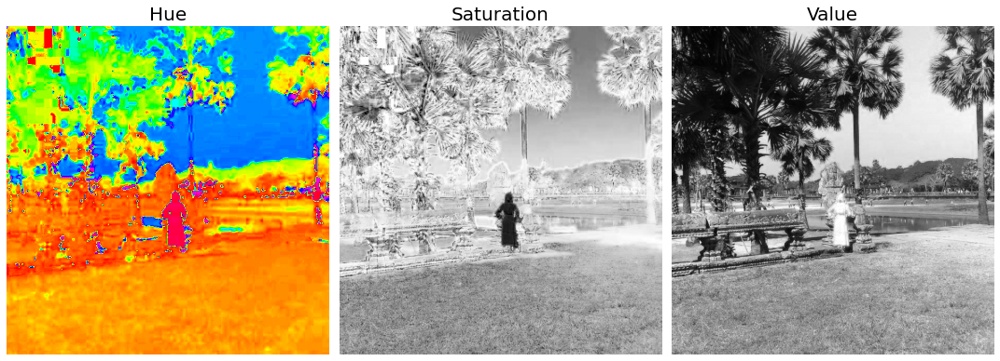

In [ ]:
#To better isolate the colors we stick with HSV
def display_as_hsv(image):
    
    img = cv2.imread(image)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    hsv_list = ['Hue','Saturation','Value']
    fig, ax = plt.subplots(1, 3, figsize=(15,7), sharey = True)
    
    red_girl_hsv = ax[0].imshow(img_hsv[:,:,0], cmap = 'hsv')
    ax[0].set_title(hsv_list[0], fontsize = 20)
    ax[0].axis('off')
    
    
    ax[1].imshow(img_hsv[:,:,1], cmap = 'Greys')
    ax[1].set_title(hsv_list[1], fontsize = 20)
    ax[1].axis('off')
    
    
    ax[2].imshow(img_hsv[:,:,2], cmap = 'gray')
    ax[2].set_title(hsv_list[2], fontsize = 20)
    ax[2].axis('off')
        
    fig.tight_layout()
display_as_hsv('red_girl.png')

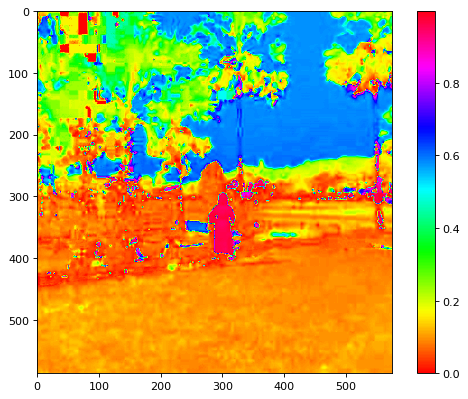

In [ ]:
red_girl = imread('red_girl.png')
red_girl_hsv = rgb2hsv(red_girl)
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(red_girl_hsv[:,:,0], cmap = 'hsv')
plt.colorbar();

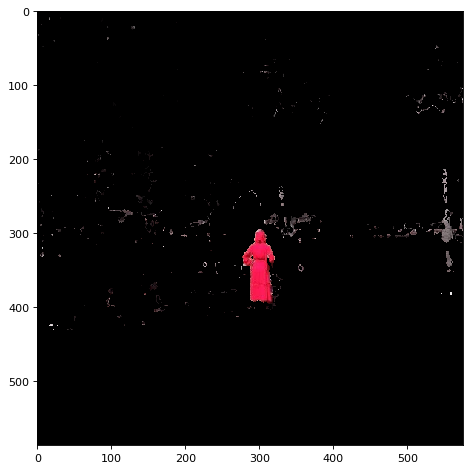

In [ ]:
lower_mask = red_girl_hsv [:,:,0] > 0.90
upper_mask = red_girl_hsv [:,:,0] < 1.00
mask = upper_mask*lower_mask

red = red_girl[:,:,0]*mask
green = red_girl[:,:,1]*mask
blue = red_girl[:,:,2]*mask
red_girl_masked = np.dstack((red,green,blue))
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(red_girl_masked);

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


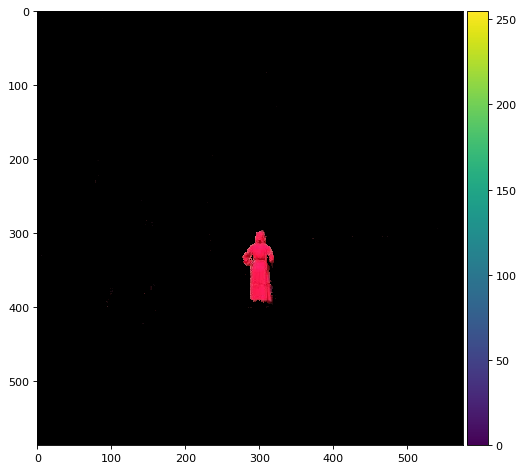

In [ ]:
lower_mask = red_girl_hsv [:,:,0] > 0.90
upper_mask = red_girl_hsv [:,:,0] < 1.00
saturation = red_girl_hsv [:,:,1] > 0.50

mask = upper_mask*lower_mask*saturation

red = red_girl[:,:,0]*mask
green = red_girl[:,:,1]*mask
blue = red_girl[:,:,2]*mask
red_girl_masked = np.dstack((red,green,blue))
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(red_girl_masked);

# Same but with anatomy

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imshow, imread
from skimage.color import rgb2hsv, hsv2rgb
import cv2

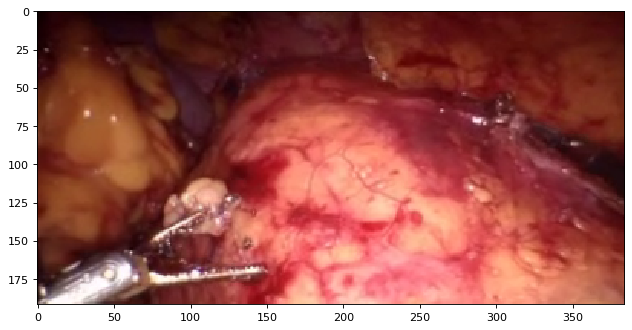

In [ ]:
robo = imread('robo.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(robo);

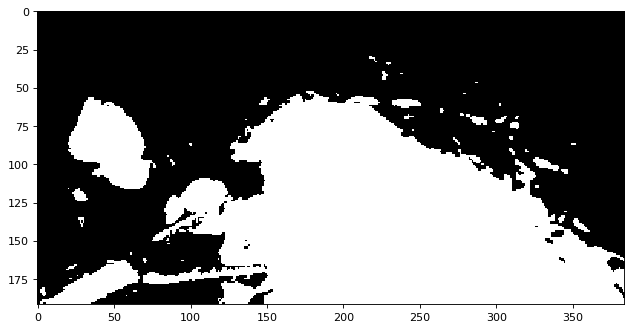

In [ ]:
robo_filter = (robo[:,:,0] > 150)
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(robo_filter, cmap = 'gray');

#desegment the lighting of the lighting 
#intensity of the lighting
#I only want to segment the max segmentation fo the high


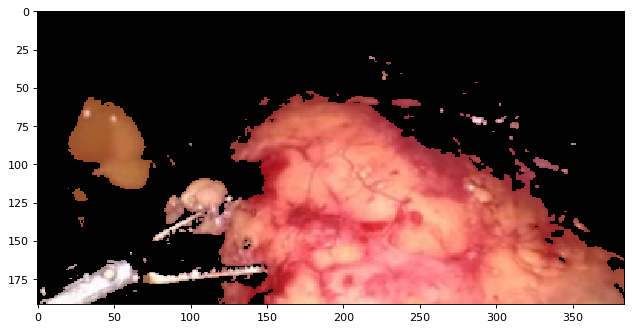

In [ ]:
robo_new = robo.copy()
robo_new[:, :, 0] = robo_new[:, :, 0]*robo_filter
robo_new[:, :, 1] = robo_new[:, :, 1]*robo_filter
robo_new[:, :, 2] = robo_new[:, :, 2]*robo_filter
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(robo_new);

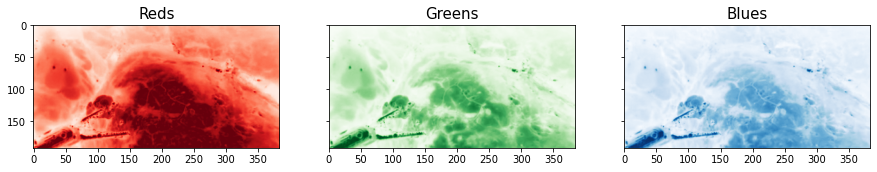

In [ ]:
def rgb_splitter(image):
    rgb_list = ['Reds','Greens','Blues']
    fig, ax = plt.subplots(1, 3, figsize=(15,5), sharey = True)
    for i in range(3):
        ax[i].imshow(image[:,:,i], cmap = rgb_list[i])
        ax[i].set_title(rgb_list[i], fontsize = 15)
rgb_splitter(robo)

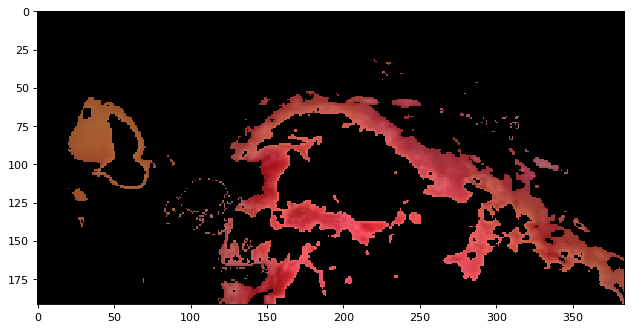

In [ ]:
#This is the red filter for the following iamge
#dive in more depty with the HSV for Hue and 
red_filtered = (robo[:,:,0] > 150) & (robo[:,:,1] < 100) & (robo[:,:,2] < 110)
plt.figure(num=None, figsize=(8, 6), dpi=80)
robo_new = robo.copy()
robo_new[:, :, 0] = robo_new[:, :, 0] * red_filtered
robo_new[:, :, 1] = robo_new[:, :, 1] * red_filtered
robo_new[:, :, 2] = robo_new[:, :, 2] * red_filtered
imshow(robo_new);

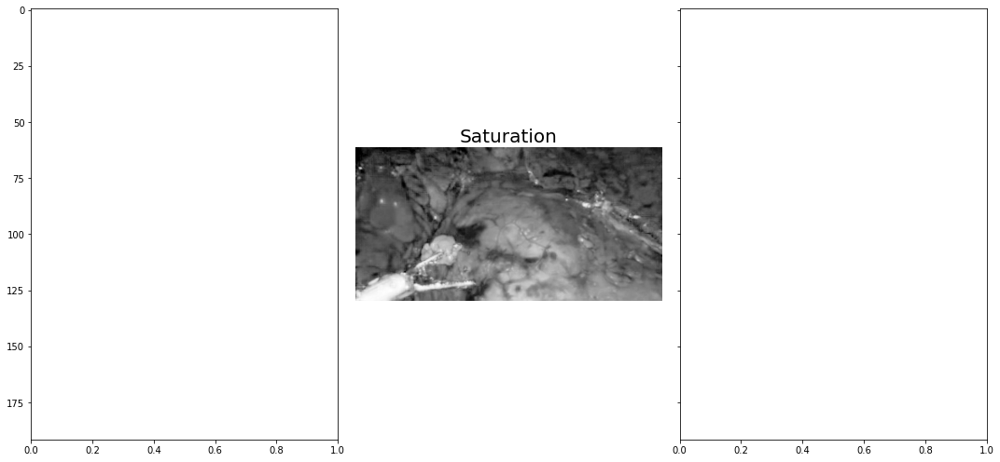

In [ ]:
def display_as_hsv(image):
    
    img = cv2.imread(image)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    hsv_list = ['Hue','Saturation','Value']
    fig, ax = plt.subplots(1, 3, figsize=(15,7), sharey = True)
    
    
    ax[1].imshow(img_hsv[:,:,1], cmap = 'Greys')
    ax[1].set_title(hsv_list[1], fontsize = 20)
    ax[1].axis('off')
    
        
    fig.tight_layout()
display_as_hsv('robo.png')

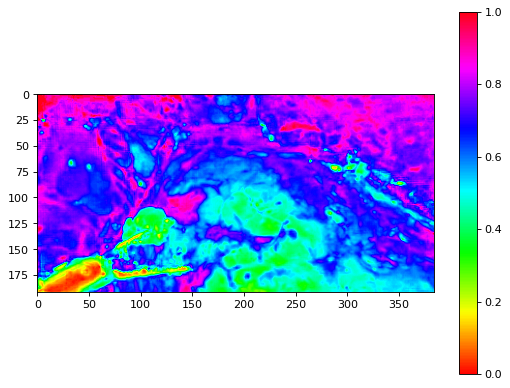

In [ ]:
robo = imread('robo.png')
robo_hsv = rgb2hsv(robo)
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(robo_hsv[:,:,1], cmap = 'hsv')
plt.colorbar();

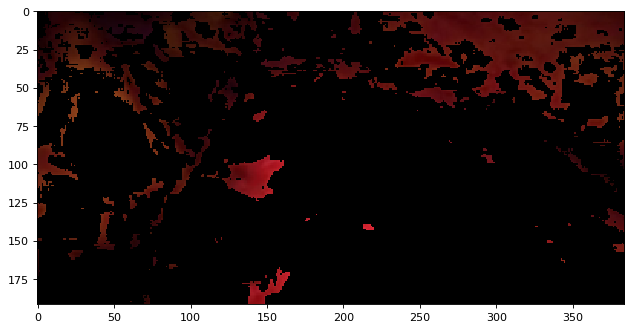

In [ ]:
lower_mask = robo_hsv [:,:,1] > 0.80
upper_mask = robo_hsv [:,:,1] < 1.00
mask = upper_mask*lower_mask

red = robo[:,:,0]*mask
green = robo[:,:,1]*mask
blue = robo[:,:,2]*mask
robo_masked = np.dstack((red,green,blue))
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(robo_masked);

# This time we are doing a different robo proecedure

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imshow, imread
from skimage.color import rgb2hsv, hsv2rgb
import cv2

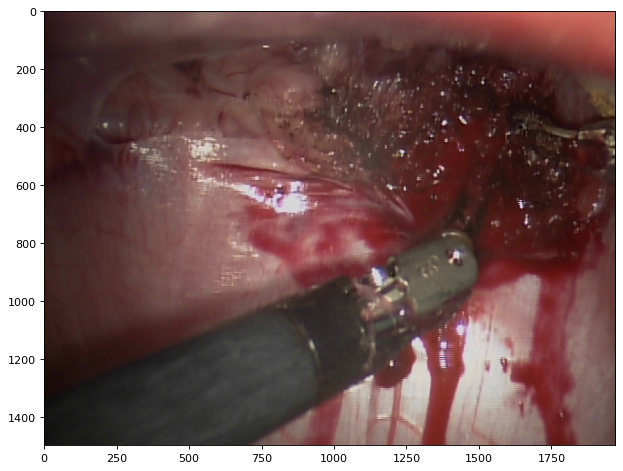

In [ ]:
robo = imread('robo2.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(robo);

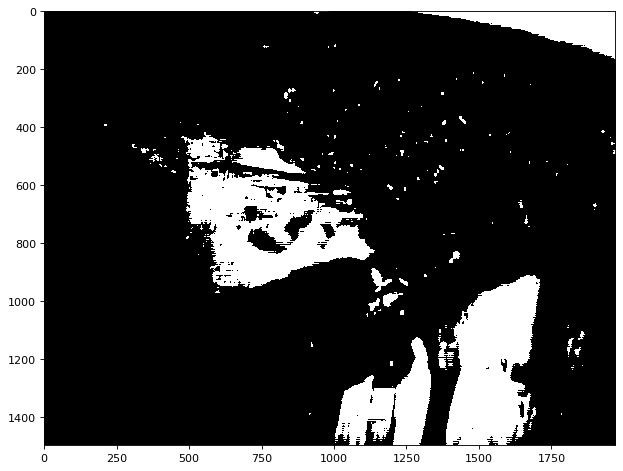

In [ ]:
robo_filter = (robo[:,:,0] > 150)
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(robo_filter, cmap = 'gray');

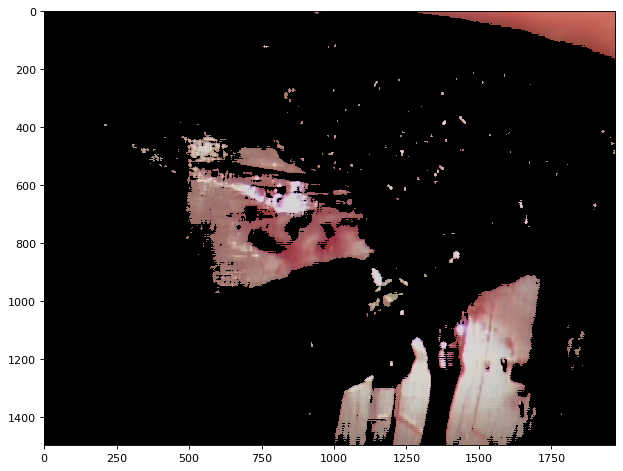

In [ ]:
robo_new = robo.copy()
robo_new[:, :, 0] = robo_new[:, :, 0]*robo_filter
robo_new[:, :, 1] = robo_new[:, :, 1]*robo_filter
robo_new[:, :, 2] = robo_new[:, :, 2]*robo_filter
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(robo_new);

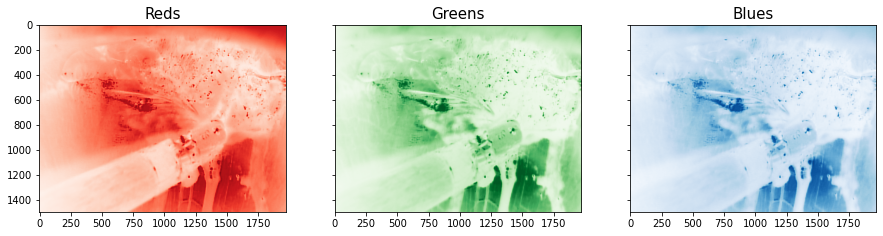

In [ ]:
def rgb_splitter(image):
    rgb_list = ['Reds','Greens','Blues']
    fig, ax = plt.subplots(1, 3, figsize=(15,5), sharey = True)
    for i in range(3):
        ax[i].imshow(image[:,:,i], cmap = rgb_list[i])
        ax[i].set_title(rgb_list[i], fontsize = 15)
rgb_splitter(robo)

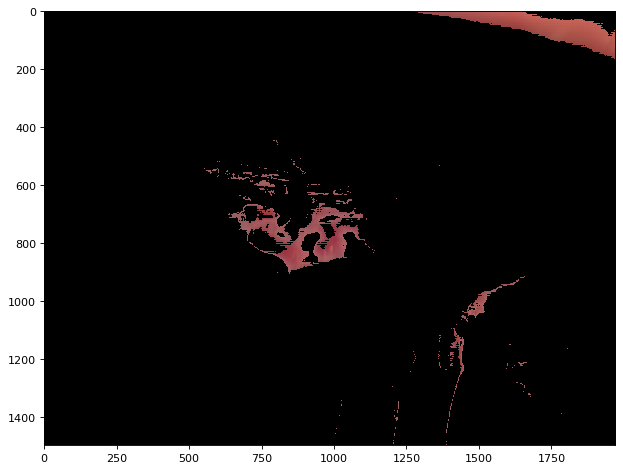

In [ ]:
#This is the red filter for the following iamge
#dive in more depty with the HSV for Hue and 
red_filtered = (robo[:,:,0] > 150) & (robo[:,:,1] < 100) & (robo[:,:,2] < 110)
plt.figure(num=None, figsize=(8, 6), dpi=80)
robo_new = robo.copy()
robo_new[:, :, 0] = robo_new[:, :, 0] * red_filtered
robo_new[:, :, 1] = robo_new[:, :, 1] * red_filtered
robo_new[:, :, 2] = robo_new[:, :, 2] * red_filtered
imshow(robo_new);

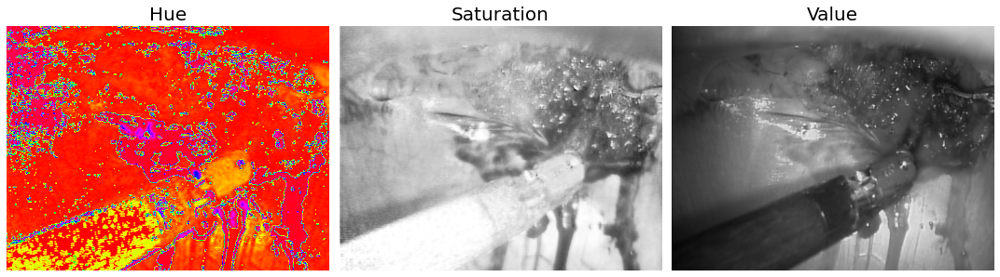

In [ ]:
def display_as_hsv(image):
    
    img = cv2.imread(image)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    hsv_list = ['Hue','Saturation','Value']
    fig, ax = plt.subplots(1, 3, figsize=(15,7), sharey = True)
    
    ax[0].imshow(img_hsv[:,:,0], cmap = 'hsv')
    ax[0].set_title(hsv_list[0], fontsize = 20)
    ax[0].axis('off')
    
    
    ax[1].imshow(img_hsv[:,:,1], cmap = 'Greys')
    ax[1].set_title(hsv_list[1], fontsize = 20)
    ax[1].axis('off')
    
    
    ax[2].imshow(img_hsv[:,:,2], cmap = 'gray')
    ax[2].set_title(hsv_list[2], fontsize = 20)
    ax[2].axis('off')
        
    fig.tight_layout()
display_as_hsv('robo2.png')

In [ ]:
robo = imread('robo2.png')
robo_hsv = rgb2hsv(robo)
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(robo_hsv[:,:,1], cmap = 'hsv')
plt.colorbar();

ValueError: ignored

In [ ]:
lower_mask = robo_hsv [:,:,0] > 0.90
upper_mask = robo_hsv [:,:,0] < 1.00
mask = upper_mask*lower_mask

red = robo[:,:,0]*mask
green = robo[:,:,1]*mask
blue = robo[:,:,2]*mask
robo_masked = np.dstack((red,green,blue))
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(robo_masked);

# Color Image Segmentation — Image Processing
https://mattmaulion.medium.com/color-image-segmentation-image-processing-4a04eca25c0

In [ ]:
from skimage.io import imread, imshow
from skimage.color import rgb2hsv
import matplotlib.pyplot as plt

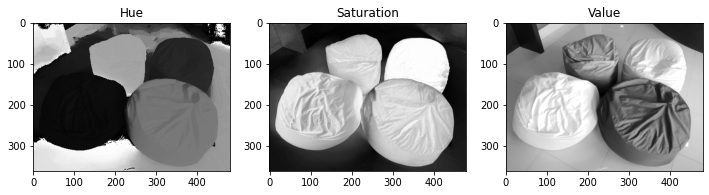

In [ ]:
bags = imread('bags.png')
bags_hsv = rgb2hsv(bags)
fig, ax = plt.subplots(1, 3, figsize=(12,4))
ax[0].imshow(bags_hsv[:,:,0], cmap='gray')
ax[0].set_title('Hue')
ax[1].imshow(bags_hsv[:,:,1], cmap='gray')
ax[1].set_title('Saturation')
ax[2].imshow(bags_hsv[:,:,2], cmap='gray')
ax[2].set_title('Value');

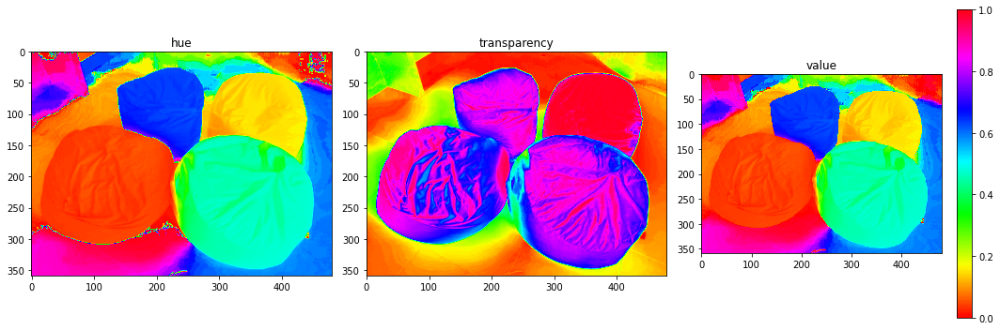

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(bags_hsv[:,:,0],cmap='hsv')
ax[0].set_title('hue')
ax[1].imshow(bags_hsv[:,:,1],cmap='hsv')
ax[1].set_title('transparency')
ax[2].imshow(bags_hsv[:,:,2],cmap='hsv')
ax[2].set_title('value')
fig.colorbar(imshow(bags_hsv[:,:,0],cmap='hsv')) 
fig.tight_layout()

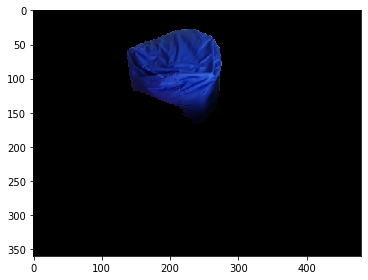

In [ ]:
#refer to hue channel (in the colorbar)
lower_mask = bags_hsv[:,:,0] > 0.6 #hue
#refer to hue channel (in the colorbar)
upper_mask = bags_hsv[:,:,0] < 0.7 #purple
#refer to transparency channel (in the colorbar)
saturation_mask = bags_hsv[:,:,1] > 0.3 
 
mask = upper_mask*lower_mask*saturation_mask
red = bags[:,:,0]*mask
green = bags[:,:,1]*mask
blue = bags[:,:,2]*mask
bags_masked = np.dstack((red,green,blue))
imshow(bags_masked)

Yellow


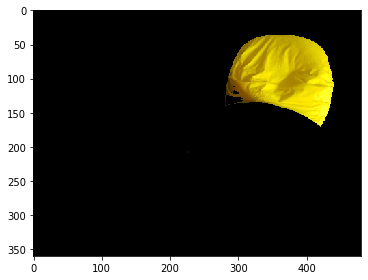

In [ ]:
#refer to hue channel (in the colorbar)
lower_mask = bags_hsv[:,:,0] > 0.1
#refer to hue channel (in the colorbar)
upper_mask = bags_hsv[:,:,0] < 0.2
#refer to transparency channel (in the colorbar)
saturation_mask = bags_hsv[:,:,1] > 0.6 
 
mask = upper_mask*lower_mask*saturation_mask
red = bags[:,:,0]*mask
green = bags[:,:,1]*mask
blue = bags[:,:,2]*mask
bags_masked = np.dstack((red,green,blue))
imshow(bags_masked)

Orange

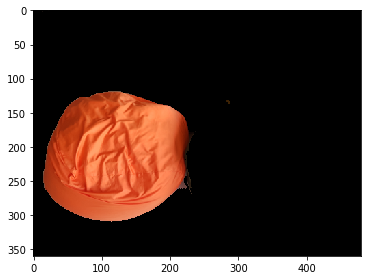

In [ ]:
#refer to hue channel (in the colorbar)
lower_mask = bags_hsv[:,:,0] > 0.0
#refer to hue channel (in the colorbar)
upper_mask = bags_hsv[:,:,0] < 0.09
#refer to transparency channel (in the colorbar)
saturation_mask = bags_hsv[:,:,1] > 0.4 
 
mask = upper_mask*lower_mask*saturation_mask

red = bags[:,:,0]*mask
green = bags[:,:,1]*mask
blue = bags[:,:,2]*mask
bags_masked = np.dstack((red,green,blue))
imshow(bags_masked)

Green

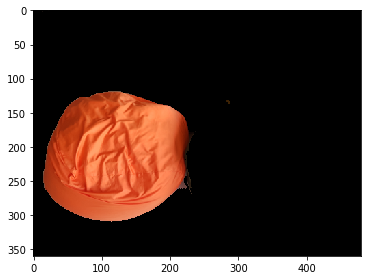

In [ ]:
#refer to hue channel (in the colorbar)
lower_mask = bags_hsv[:,:,0] > 0.0
#refer to hue channel (in the colorbar)
upper_mask = bags_hsv[:,:,0] < 0.09
#refer to transparency channel (in the colorbar)
saturation_mask = bags_hsv[:,:,1] > 0.4 
 
mask = upper_mask*lower_mask*saturation_mask
red = bags[:,:,0]*mask
green = bags[:,:,1]*mask
blue = bags[:,:,2]*mask
bags_masked = np.dstack((red,green,blue))
imshow(bags_masked)

Anatomy Images

# Separate colors in immunohistochemical staining
https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_ihc_color_separation.html

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2hed, hed2rgb

# Example IHC image
ihc_rgb = data.immunohistochemistry()

# Separate the stains from the IHC image
ihc_hed = rgb2hed(ihc_rgb)

# Create an RGB image for each of the stains
null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

# Display
fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(ihc_rgb)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

ax[2].imshow(ihc_e)
ax[2].set_title("Eosin")  # Note that there is no Eosin stain in this image

ax[3].imshow(ihc_d)
ax[3].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

#Capture2 AVI


In [ ]:
from IPython.display import HTML
from base64 import b64encode
avi = open('capture2.avi','rb').read()
data_url = "data:video/avi;base64," + b64encode(avi).decode()

In [ ]:
HTML("""
<video width=400 controls>
      <source src="%s" type="video/avi">
</video>
""" % data_url)

# Code - Tracking Blue Object
https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Changing_ColorSpaces_RGB_HSV_HLS.php

In [ ]:
# cspace.py
import cv2
import numpy as np

cap = cv2.VideoCapture('BlueUmbrella.webm')

while(1):

    # Take each frame
    _, frame = cap.read()

    # Convert BGR to HSV
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    # define range of blue color in HSV
    lower_blue = np.array([110,50,50])
    upper_blue = np.array([130,255,255])

    # Threshold the HSV image to get only blue colors
    mask = cv2.inRange(hsv, lower_blue, upper_blue)

    # Bitwise-AND mask and original image
    res = cv2.bitwise_and(frame,frame, mask= mask)

    cv2.imshow('frame',frame)
    cv2.imshow('mask',mask)
    cv2.imshow('res',res)

    k = cv2.waitKey(5) & 0xFF
    if k == 27:
        break

cv2.destroyAllWindows()

# PLaying video data
https://stackoverflow.com/questions/60747123/how-to-play-a-video-in-colab

In [ ]:
from IPython.display import HTML
from base64 import b64encode
video_path = 'robo.mp4'

mp4 = open(video_path,'rb').read()
decoded_vid = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f'<video width=400 controls><source src={decoded_vid} type="video/mp4"></video>')